In [1]:
import pandas as pd
!pip install numpy
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from scipy import stats
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings("ignore", category=UserWarning)

## Importing the Housing_Data with the tools

In [2]:
# Load the dataset into a Pandas DataFrame.

df = pd.read_excel('housing_data.xlsx')

 # this code is for show all columns so it will be helpfull for watching all the columns in single row.

pd.set_option('display.max_columns', None) 
pd.set_option('display.max_rows', None)

In [3]:
df

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000
5,5,SC50,RL,85,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,No,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,No,MnPrv,Shed,700,Oct,2009,WD,Normal,143000
6,6,SC20,RL,75,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,307000
7,7,SC60,RL,0,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,No,No,Shed,350,Nov,2009,WD,Normal,200000
8,8,SC50,RM,51,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,No,No,No,0,Apr,2008,WD,Abnorml,129900
9,9,SC190,RL,50,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,Y,SBrkr,1077,0,0,1077,1,

In [4]:
df.shape

(1460, 81)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
df.isnull().sum()

Unnamed: 0          0
MSSubClass          0
MSZoning            0
LotFrontage         0
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType        872
MasVnrArea          0
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual            0
BsmtCond            0
BsmtExposure        0
BsmtFinType1        0
BsmtFinSF1          0
BsmtFinType2        0
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

# Missing Values  

 A significant portion of the notebook focuses on identifying and handling missing values. This is a critical step in data preprocessing, as missing data can bias or invalidate modeling results

In [7]:
# missing values
null = df.isnull().sum()
null[null > 0]

Alley          1369
MasVnrType      872
Electrical        1
GarageYrBlt      81
dtype: int64

### Here abive we get the all the missing values so we will get what we have to edit or remove from the data.

### Initial Exploration: 
The code displays the first few rows of the DataFrame (df.info()) and provides descriptive statistics (df.describe(include = 'all')). This is crucial for understanding the data's structure, identifying potential issues (like missing values), and getting a sense of the variable distributions.

In [8]:
df.describe()

,Unnamed: 0,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,729.500000,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,2007.815753,180921.195890
std,421.610009,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,1.328095,79442.502883
min,0.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,364.750000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,729.500000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000
75%,1094.250000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,1459.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,2010.000000,755000.000000


In [9]:
df.describe(include="O")

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,SaleType,SaleCondition
count,1460,1460,1460,91,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,588,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1459,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,15,5,2,2,4,4,2,5,3,25,9,8,5,8,6,8,15,16,3,4,5,6,5,5,4,7,7,6,5,2,5,4,7,6,7,4,6,6,3,4,5,5,12,9,6
top,SC20,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,No,Attchd,Unf,TA,TA,Y,No,No,No,Jun,WD,Normal
freq,536,1151,1454,50,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,445,906,1282,647,649,1311,991,430,1256,1428,741,1365,1334,735,1360,690,870,605,1311,1326,1340,1453,1179,1406,253,1267,1198


In [10]:
df['HouseStyle'].unique()

array(['2Story', '1Story', '1.5Fin', '1.5Unf', 'SFoyer', 'SLvl', '2.5Unf',
       '2.5Fin'], dtype=object)

#### EDA & Pre - processing 

EDA : Exploratory Data Analysis(Visualization):

The main goal of Exploratory Data Analysis (EDA) is to understand the data better using visual tools like charts and graphs.
Understand the Data: Visualizations like histograms, box plots, and scatter plots helps quickly to see the distribution, trends, and relationships.

Identify Patterns: It helps to see connections or trends in the data.

Find Outliers: Visualizations of box plot helps to identify unusual data points or outliers.

Detect Missing Data: Visuals can show if any data is missing or incomplete.

Types of Exploratory Data Analysis:

### Univariate:

Plots display the distribution or summary of a single variable.

### Bivariate:

Plots show the relationship between two variables.

### Multivariate:

Plots reveal relationships among multiple variables.

In [11]:
df.duplicated().sum()

0

## Dropping the columns 
those columns are not in use or have unnecessary columns which we should dropped 

In [12]:
# Droping columns with high no of missing values & not necessary columns

df.drop(columns = ['LotFrontage','Neighborhood','Alley','Exterior1st','Exterior2nd','GarageType', 'GarageYrBlt', 'GarageFinish',
                   'GarageQual', 'GarageCond','1stFlrSF','2ndFlrSF','WoodDeckSF','BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
                   'Heating','HeatingQC','Functional','BldgType','RoofMatl','RoofStyle','Condition1','Condition2',
                  'MiscFeature','Fence','PoolQC','ExterCond','Electrical','BsmtCond'],inplace = True)

In [13]:
df.head()

,Unnamed: 0,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,PavedDrive,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,2Story,7,5,2003,2003,BrkFace,196,Gd,PConc,Gd,706,0,150,856,Y,0,1710,1,0,2,1,3,1,Gd,8,0,No,2,548,Y,61,0,0,0,0,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,1Story,6,8,1976,1976,NaN,0,TA,CBlock,Gd,978,0,284,1262,Y,0,1262,0,1,2,0,3,1,TA,6,1,TA,2,460,Y,0,0,0,0,0,0,May,2007,WD,Normal,181500
2,2,SC60,RL,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,2Story,7,5,2001,2002,BrkFace,162,Gd,PConc,Gd,486,0,434,920,Y,0,1786,1,0,2,1,3,1,Gd,6,1,TA,2,608,Y,42,0,0,0,0,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,2Story,7,5,1915,1970,NaN,0,TA,BrkTil,TA,216,0,540,756,Y,0,1717,1,0,1,0,3,1,Gd,7,1,Gd,3,642,Y,35,272,0,0,0,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,2Story,8,5,2000,2000,BrkFace,350,Gd,PConc,Gd,655,0,490,1145,Y,0,2198,1,0,2,1,4,1,Gd,9,1,TA,3,836,Y,84,0,0,0,0,0,Dec,2008,WD,Normal,250000


In [14]:
# numerical

numerical_col = df.select_dtypes(include = "number").columns.to_list()
numerical_col.remove('Unnamed: 0')
df[numerical_col].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 30 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   LotArea        1460 non-null   int64
 1   OverallQual    1460 non-null   int64
 2   OverallCond    1460 non-null   int64
 3   YearBuilt      1460 non-null   int64
 4   YearRemodAdd   1460 non-null   int64
 5   MasVnrArea     1460 non-null   int64
 6   BsmtFinSF1     1460 non-null   int64
 7   BsmtFinSF2     1460 non-null   int64
 8   BsmtUnfSF      1460 non-null   int64
 9   TotalBsmtSF    1460 non-null   int64
 10  LowQualFinSF   1460 non-null   int64
 11  GrLivArea      1460 non-null   int64
 12  BsmtFullBath   1460 non-null   int64
 13  BsmtHalfBath   1460 non-null   int64
 14  FullBath       1460 non-null   int64
 15  HalfBath       1460 non-null   int64
 16  BedroomAbvGr   1460 non-null   int64
 17  KitchenAbvGr   1460 non-null   int64
 18  TotRmsAbvGrd   1460 non-null   int64
 19  Firepl

### Data Types: 

The code checks data types and converts columns to appropriate formats (numerical or categorical).

In [15]:
# categorial

categorical_col = df.select_dtypes(include = "O").columns.to_list()
df[categorical_col].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   MSSubClass     1460 non-null   object
 1   MSZoning       1460 non-null   object
 2   Street         1460 non-null   object
 3   LotShape       1460 non-null   object
 4   LandContour    1460 non-null   object
 5   Utilities      1460 non-null   object
 6   LotConfig      1460 non-null   object
 7   LandSlope      1460 non-null   object
 8   HouseStyle     1460 non-null   object
 9   MasVnrType     588 non-null    object
 10  ExterQual      1460 non-null   object
 11  Foundation     1460 non-null   object
 12  BsmtQual       1460 non-null   object
 13  CentralAir     1460 non-null   object
 14  KitchenQual    1460 non-null   object
 15  FireplaceQu    1460 non-null   object
 16  PavedDrive     1460 non-null   object
 17  MoSold         1460 non-null   object
 18  SaleType       1460 non-null

In [16]:
for col in categorical_col:
  print(f"{col}:\t {list(df[col].unique())}")

MSSubClass:	 ['SC60', 'SC20', 'SC70', 'SC50', 'SC190', 'SC45', 'SC90', 'SC120', 'SC30', 'SC85', 'SC80', 'SC160', 'SC75', 'SC180', 'SC40']
MSZoning:	 ['RL', 'RM', 'C (all)', 'FV', 'RH']
Street:	 ['Pave', 'Grvl']
LotShape:	 ['Reg', 'IR1', 'IR2', 'IR3']
LandContour:	 ['Lvl', 'Bnk', 'Low', 'HLS']
Utilities:	 ['AllPub', 'NoSeWa']
LotConfig:	 ['Inside', 'FR2', 'Corner', 'CulDSac', 'FR3']
LandSlope:	 ['Gtl', 'Mod', 'Sev']
HouseStyle:	 ['2Story', '1Story', '1.5Fin', '1.5Unf', 'SFoyer', 'SLvl', '2.5Unf', '2.5Fin']
MasVnrType:	 ['BrkFace', nan, 'Stone', 'BrkCmn']
ExterQual:	 ['Gd', 'TA', 'Ex', 'Fa']
Foundation:	 ['PConc', 'CBlock', 'BrkTil', 'Wood', 'Slab', 'Stone']
BsmtQual:	 ['Gd', 'TA', 'Ex', 'No', 'Fa']
CentralAir:	 ['Y', 'N']
KitchenQual:	 ['Gd', 'TA', 'Ex', 'Fa']
FireplaceQu:	 ['No', 'TA', 'Gd', 'Fa', 'Ex', 'Po']
PavedDrive:	 ['Y', 'N', 'P']
MoSold:	 ['Feb', 'May', 'Sep', 'Dec', 'Oct', 'Aug', 'Nov', 'Apr', 'Jan', 'Jul', 'Mar', 'Jun']
SaleType:	 ['WD', 'New', 'COD', 'ConLD', 'ConLI', 'CWD',

#### The above given code is designed to provide a quick overview of the unique categories in each categorical column of a dataset. By printing out the unique values for each categorical column, the analysis can identify the diversity and range within the dataset, which is essential for understanding the data and preparing it for further analysis.

In [17]:
# Replacing the names

df['MSZoning'] = df['MSZoning'].replace({'RL': 'Residential Low Density', 'RM': 'Residential Medium Density',
                                         'FV': 'Floating Village Residential', 'RH': 'Residential High Density', 'C (all)': 'Commercial'})

df['Street'] = df['Street'].replace({'Grvl': 'Gravel', 'Pave': 'Paved'})

df['LotShape'] = df['LotShape'].replace({'Reg': 'Regular', 'IR1': 'Slightly irregular', 'IR2': 'Moderately Irregular', 'IR3': 'Irregular'})

df['LandContour'] = df['LandContour'].replace({'Lvl': 'Near Flat', 'Bnk': 'Banked', 'Low': 'Low', 'HLS': 'Hillside'})

df['Utilities'] = df['Utilities'].replace({'AllPub': 'All public Utilities', 'NoSewr': 'Electricity, Gas, and Water',
                                           'NoSeWa': 'Electricity and Gas Only', 'ELO': 'Electricity only'})

df['LotConfig'] = df['LotConfig'].replace({'Inside': 'Inside', 'FR2': 'Frontage on 2 sides of property', 'Corner': 'Corner',
                                           'Cul-de' : 'CulDSac','FR3' : 'Frontage on 3 sides of property'})

df['LandSlope'] = df['LandSlope'].replace({'Gtl': 'Gentle slope', 'Mod': 'Moderate Slope', 'Sev': 'Severe Slope'})

df['MasVnrType'] = df['MasVnrType'].replace({'BrkCmn': 'Brick Common', 'BrkFace': 'Brick Face', 'Stone': 'Stone',
                                             'CBlock': 'Cinder Block'})

df['ExterQual'] = df['ExterQual'].replace({'Gd': 'Good', 'TA': 'Average', 'Ex': 'Excellent', 'Fa': 'Fair'})

df['Foundation'] = df['Foundation'].replace({'PConc': 'Poured Concrete', 'CBlock': 'Cinder Block', 'BrkTil': 'Brick & Tile',
                                             'Wood': 'Wood', 'Stone': 'Stone'})

df['BsmtQual'] = df['BsmtQual'].replace({'Gd': 'Good', 'TA': 'Average', 'Ex': 'Excellent', 'Fa': 'Fair', 'Po': 'Poor'})

df['CentralAir'] = df['CentralAir'].replace({'Y': 'Yes', 'N': 'No'})

df['KitchenQual'] = df['KitchenQual'].replace({'Gd': 'Good', 'TA': 'Average', 'Ex': 'Excellent', 'Fa': 'Fair'})

df['FireplaceQu'] = df['FireplaceQu'].replace({'Gd': 'Good', 'TA': 'Average', 'Ex': 'Excellent', 'Fa': 'Fair', 'Po': 'Poor'})

df['PavedDrive'] = df['PavedDrive'].replace({'Y': 'Yes', 'P': 'Partial', 'N': 'No'})

df['SaleType'] = df['SaleType'].replace({
    'WD': 'Conventional',
    'CWD': 'Cash',
    'VWD': 'VA Loan',
    'New': 'New Home',
    'COD': 'Court Deed',
    'Con': 'Contract',
    'ConLw': 'Low Down & Interest',
    'ConLI': 'Low Interest',
    'ConLD': 'Low Down',
    'Oth': 'Other'
})


df['SaleCondition'] = df['SaleCondition'].replace({"Normal": "Normal Sale", "Abnorml": "Abnormal Sale","AdjLand": "Adjoining Land Purchase",
                                                  'Partial' : 'Incomplete home','Family': 'Family sale','Alloca': 'Combined properties' })

##### The provided code demonstrates a process of replacing abbreviated or code-like categorical values with more descriptive and human-readable names in a dataset. This step is crucial for improving the interpretability of the data, making it easier to understand and communicate findings to stakeholders. Here's a detailed insight into what each transformation accomplishes.

In [18]:
df

,Unnamed: 0,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Fireplaces,FireplaceQu,GarageCars,GarageArea,PavedDrive,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,Residential Low Density,8450,Paved,Regular,Near Flat,All public Utilities,Inside,Gentle slope,2Story,7,5,2003,2003,Brick Face,196,Good,Poured Concrete,Good,706,0,150,856,Yes,0,1710,1,0,2,1,3,1,Good,8,0,No,2,548,Yes,61,0,0,0,0,0,Feb,2008,Conventional,Normal Sale,208500
1,1,SC20,Residential Low Density,9600,Paved,Regular,Near Flat,All public Utilities,Frontage on 2 sides of property,Gentle slope,1Story,6,8,1976,1976,NaN,0,Average,Cinder Block,Good,978,0,284,1262,Yes,0,1262,0,1,2,0,3,1,Average,6,1,Average,2,460,Yes,0,0,0,0,0,0,May,2007,Conventional,Normal Sale,181500
2,2,SC60,Residential Low Density,11250,Paved,Slightly irregular,Near Flat,All public Utilities,Inside,Gentle slope,2Story,7,5,2001,2002,Brick Face,162,Good,Poured Concrete,Good,486,0,434,920,Yes,0,1786,1,0,2,1,3,1,Good,6,1,Average,2,608,Yes,42,0,0,0,0,0,Sep,2008,Conventional,Normal Sale,223500
3,3,SC70,Residential Low Density,9550,Paved,Slightly irregular,Near Flat,All public Utilities,Corner,Gentle slope,2Story,7,5,1915,1970,NaN,0,Average,Brick & Tile,Average,216,0,540,756,Yes,0,1717,1,0,1,0,3,1,Good,7,1,Good,3,642,Yes,35,272,0,0,0,0,Feb,2006,Conventional,Abnormal Sale,140000
4,4,SC60,Residential Low Density,14260,Paved,Slightly irregular,Near Flat,All public Utilities,Frontage on 2 sides of property,Gentle slope,2Story,8,5,2000,2000,Brick Face,350,Good,Poured Concrete,Good,655,0,490,1145,Yes,0,2198,1,0,2,1,4,1,Good,9,1,Average,3,836,Yes,84,0,0,0,0,0,Dec,2008,Conventional,Normal Sale,250000
5,5,SC50,Residential Low Density,14115,Paved,Slightly irregular,Near Flat,All public Utilities,Inside,Gentle slope,1.5Fin,5,5,1993,1995,NaN,0,Average,Wood,Good,732,0,64,796,Yes,0,1362,1,0,1,1,1,1,Average,5,0,No,2,480,Yes,30,0,320,0,0,700,Oct,2009,Conventional,Normal Sale,143000
6,6,SC20,Residential Low Density,10084,Paved,Regular,Near Flat,All public Utilities,Inside,Gentle slope,1Story,8,5,2004,2005,Stone,186,Good,Poured Concrete,Excellent,1369,0,317,1686,Yes,0,1694,1,0,2,0,3,1,Good,7,1,Good,2,636,Yes,57,0,0,0,0,0,Aug,2007,Conventional,Normal Sale,307000
7,7,SC60,Residential Low Density,10382,Paved,Slightly irregular,Near Flat,All public Utilities,Corner,Gentle slope,2Story,7,6,1973,1973,Stone,240,Average,Cinder Block,Good,859,32,216,1107,Yes,0,2090,1,0,2,1,3,1,Average,7,2,Average,2,484,Yes,204,228,0,0,0,350,Nov,2009,Conventional,Normal Sale,200000
8,8,SC50,Residential Medium Density,6120,Paved,Regular,Near Flat,All public Utilities,Inside,Gentle slope,1.5Fin,7,5,1931,1950,NaN,0,Average,Brick & Tile,Average,0,0,952,952,Yes,0,1774,0,0,2,0,2,2,Average,8,2,Average,2,468,Yes,0,205,0,0,0,0,Apr,2008,Conventional,Abnormal Sale,129900
9,9,SC190,Residential Low Density,7420,Paved,Regular,Near Flat,All public Utilities,Corner,Gentle slope,1.5Unf,5,6,1939,1950,NaN,0,Average,Brick & Tile,Average,851,0,140,991,Yes,0,1077,1,0,1,0,2,2,Average,5,2,Average,1,205,Yes,4,0,0,0,0,0,Jan,2008,Conventional,Normal Sale,118000


# Univariate

In [19]:
numerical_columns = df.select_dtypes(include=['number']).columns.tolist()

In [20]:
numerical_columns

['Unnamed: 0',
 'LotArea',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'BsmtFinSF1',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageCars',
 'GarageArea',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'YrSold',
 'SalePrice']

In [21]:
categorical_columns = df.select_dtypes(exclude=['number']).columns.tolist()

In [22]:
categorical_columns

['MSSubClass',
 'MSZoning',
 'Street',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'HouseStyle',
 'MasVnrType',
 'ExterQual',
 'Foundation',
 'BsmtQual',
 'CentralAir',
 'KitchenQual',
 'FireplaceQu',
 'PavedDrive',
 'MoSold',
 'SaleType',
 'SaleCondition']

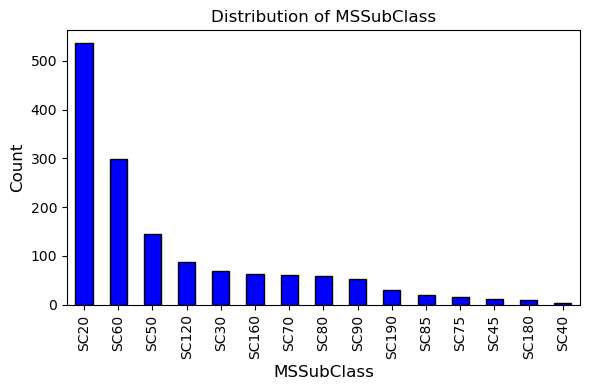

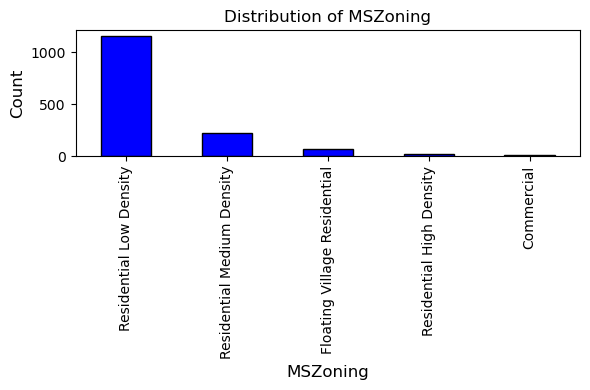

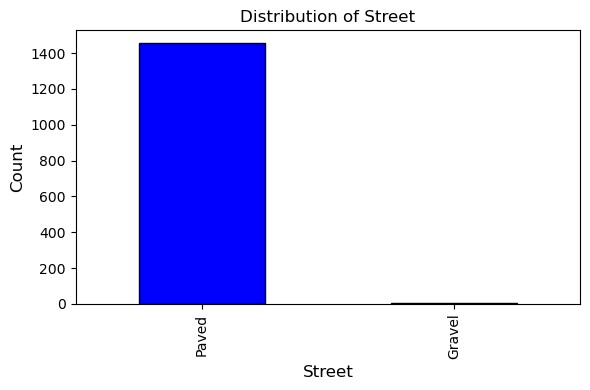

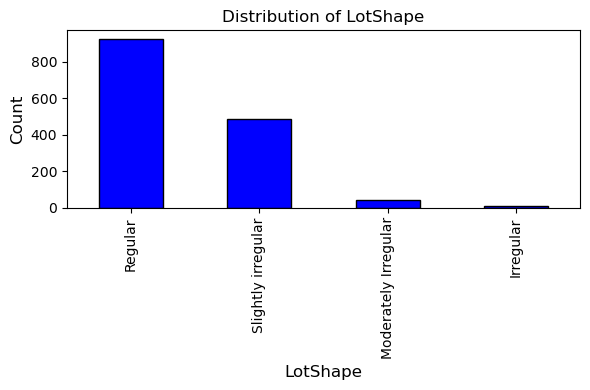

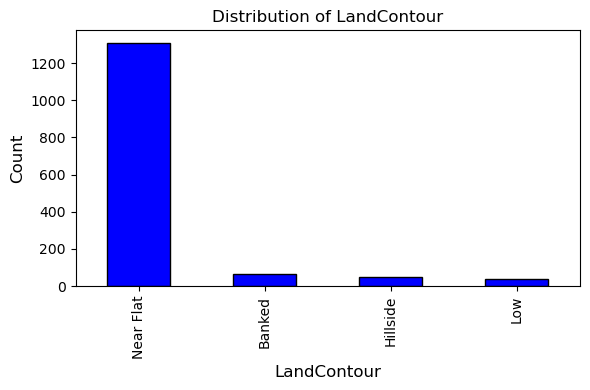

...

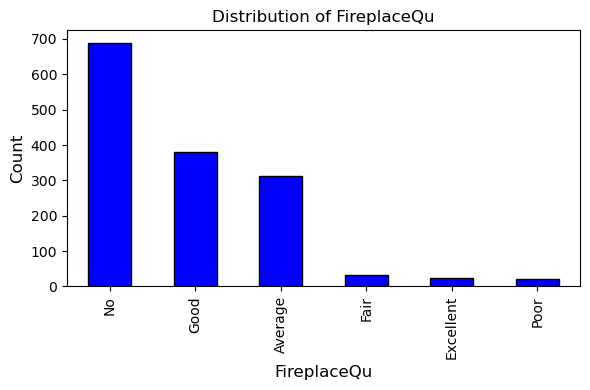

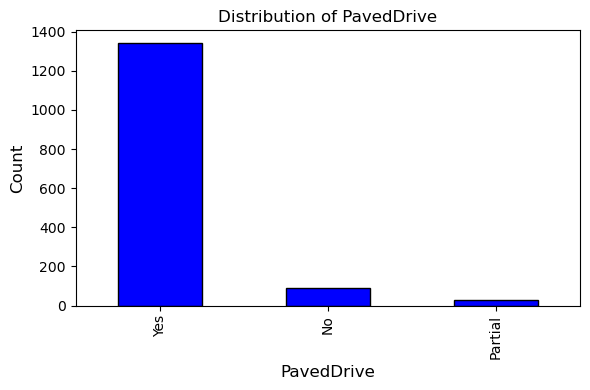

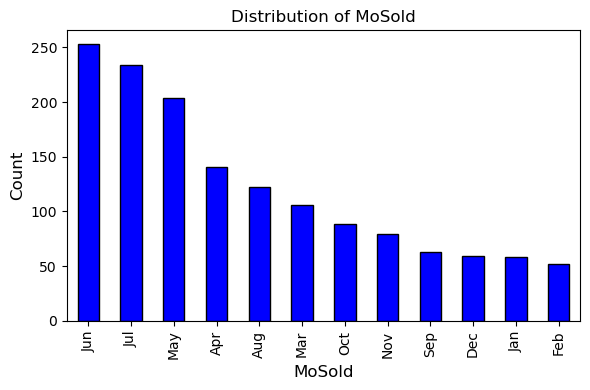

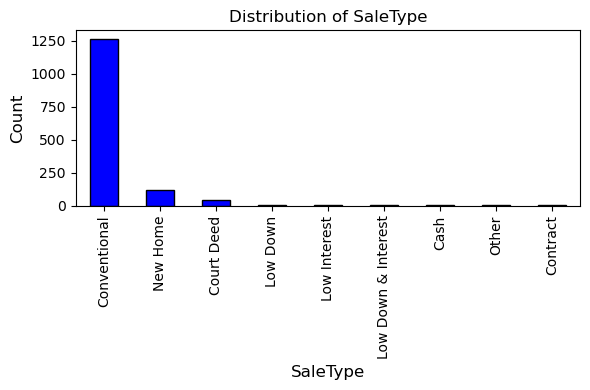

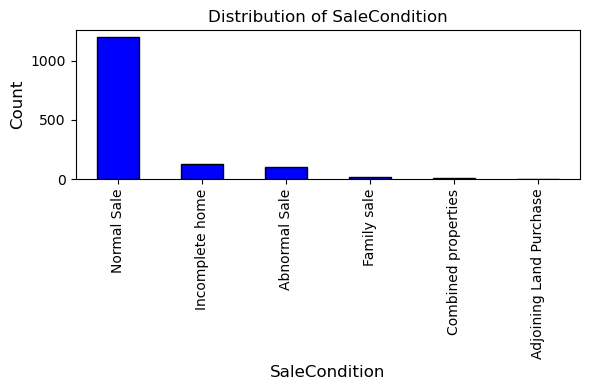

In [23]:
for col in categorical_columns:
    plt.figure(figsize=(6,4))
    df[col].value_counts().plot(kind='bar', color='blue', edgecolor='black')
    plt.title(f'Distribution of {col}', fontsize=12)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(fontsize=10)
    plt.tight_layout()
    plt.show()

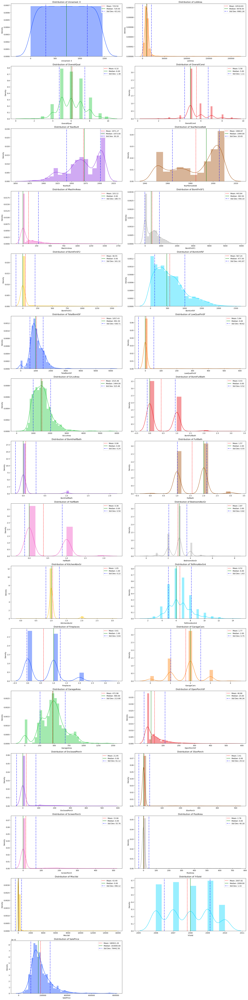

In [24]:

numeric_cols = df.select_dtypes(include=['float64', 'int64','int32']).columns
 
plt.figure(figsize=(20, 80))
for i, col in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//2 + 1, 2, i + 1)
    sns.distplot(df[col], color=sns.color_palette("bright", len(numeric_cols))[i], kde=True)
    plt.title(f'Distribution of {col}')
 
    mean = df[col].mean()
    std_dev = df[col].std()
    median = df[col].median()
    plt.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='green', linestyle='-', label=f'Median: {median:.2f}')
    plt.axvline(mean + std_dev, color='blue', linestyle='-.', label=f'Std Dev: {std_dev:.2f}')
    plt.axvline(mean - std_dev, color='blue', linestyle='-.')
 
    plt.legend(loc='upper right')
 
plt.tight_layout()
plt.show()

In [25]:
#Selecting only numerical columns  

numerical_columns = df.select_dtypes(include=['float64', 'int64','int32']).columns
 
def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    capped = np.where(df[column] < lower_bound, lower_bound, np.where(df[column] > upper_bound, upper_bound, df[column]))
    return capped.astype(df[column].dtype)
 
for column in numerical_columns:
    df[column] = cap_outliers(df, column)
 
print(df.describe())

        Unnamed: 0       LotArea  OverallQual  OverallCond    YearBuilt  \
count  1460.000000   1460.000000  1460.000000  1460.000000  1460.000000   
mean    729.500000   9647.364384     6.100685     5.500685  1971.299315   
std     421.610009   3594.306686     1.378430     0.930409    30.108397   
min       0.000000   1481.000000     2.000000     3.000000  1885.000000   
25%     364.750000   7553.500000     5.000000     5.000000  1954.000000   
50%     729.500000   9478.500000     6.000000     5.000000  1973.000000   
75%    1094.250000  11601.500000     7.000000     6.000000  2000.000000   
max    1459.000000  17673.000000    10.000000     7.000000  2010.000000   

       YearRemodAdd   MasVnrArea   BsmtFinSF1  BsmtFinSF2    BsmtUnfSF  \
count   1460.000000  1460.000000  1460.000000      1460.0  1460.000000   
mean    1984.865753    89.364384   439.994521         0.0   563.767808   
std       20.645407   133.916985   433.210157         0.0   431.684396   
min     1950.000000     0.00

## Continuous columns

##### "Selecting continuous numerical columns by filtering out discrete columns based on data type (int64 or float64) and ensuring they have more than 20 unique values."

#### Why avoiding discrete columns for analysis:
                             
##### Discrete columns have limited unique values and don’t show smooth trends, making them unsuitable for continuous analysis or visualizations.

In [26]:
numeric_continuous = [col for col in numerical_col if df[col].dtype in ['int64', 'float64'] and df[col].nunique() > 20]
df[numeric_continuous].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype
---  ------        --------------  -----
 0   LotArea       1460 non-null   int64
 1   YearBuilt     1460 non-null   int64
 2   YearRemodAdd  1460 non-null   int64
 3   MasVnrArea    1460 non-null   int64
 4   BsmtFinSF1    1460 non-null   int64
 5   BsmtUnfSF     1460 non-null   int64
 6   TotalBsmtSF   1460 non-null   int64
 7   GrLivArea     1460 non-null   int64
 8   GarageArea    1460 non-null   int64
 9   OpenPorchSF   1460 non-null   int64
 10  SalePrice     1460 non-null   int64
dtypes: int64(11)
memory usage: 125.6 KB


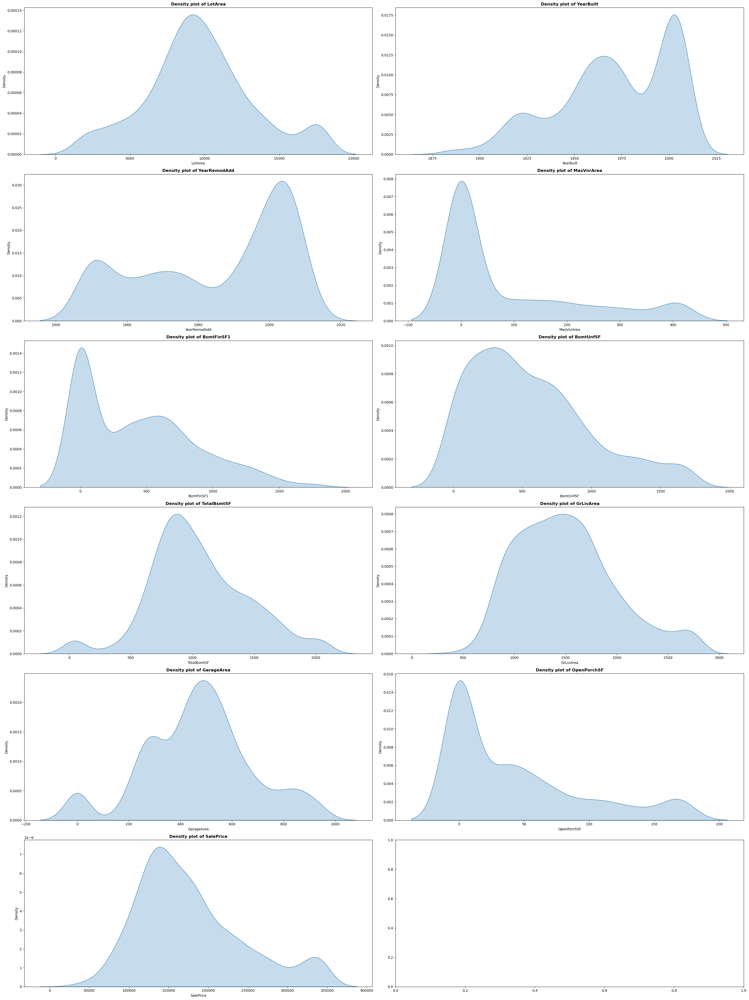

In [27]:
fig,axes = plt.subplots(nrows = 6,ncols = 2,figsize = (30,40))
axes = axes.flatten()

for index,col in enumerate(numeric_continuous):
  sns.kdeplot(df[col],ax = axes[index],fill = True).set_title(f"Density plot of {col}",fontweight = 'bold')

plt.tight_layout()
plt.show()

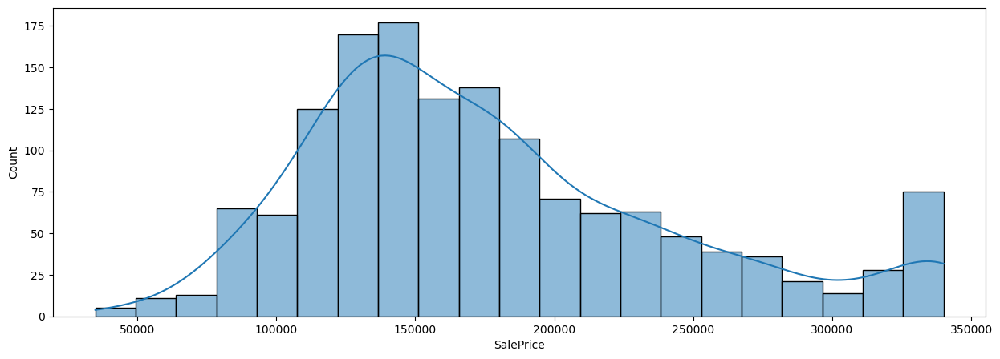

In [28]:
plt.figure(figsize = (15,5))
sns.histplot(x = 'SalePrice',data = df,kde = True)
plt.show()

Bivariate

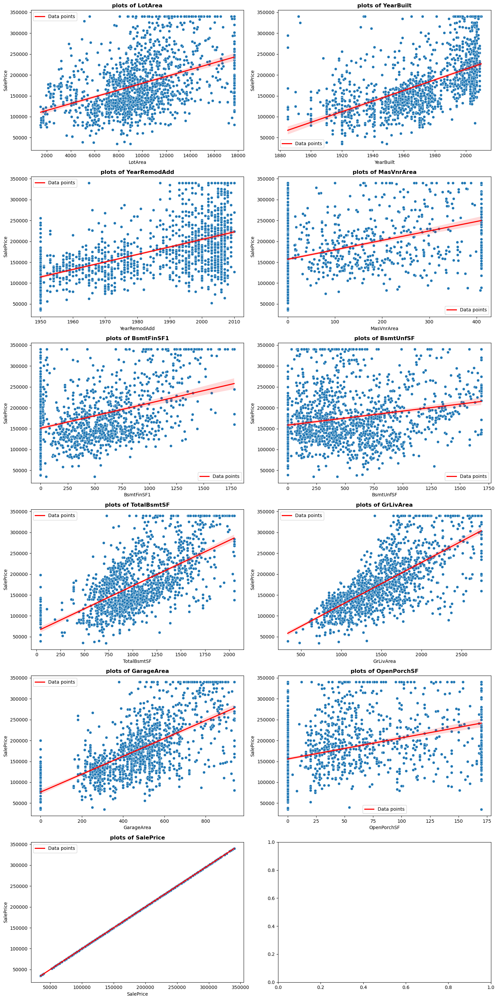

In [29]:
fig , axes = plt.subplots(nrows = 6,ncols = 2 , figsize = (15,30))
axes = axes.flatten()

for index,col in enumerate(numeric_continuous):
  sns.scatterplot(x=col,y='SalePrice',data = df,ax = axes[index]).set_title(f"plots of {col}",fontweight = 'bold')
  sns.regplot(x=col,y='SalePrice',data = df,scatter = False,ax = axes[index],label = 'Data points',color = 'red')
  axes[index].legend()
  plt.tight_layout()


plt.show()

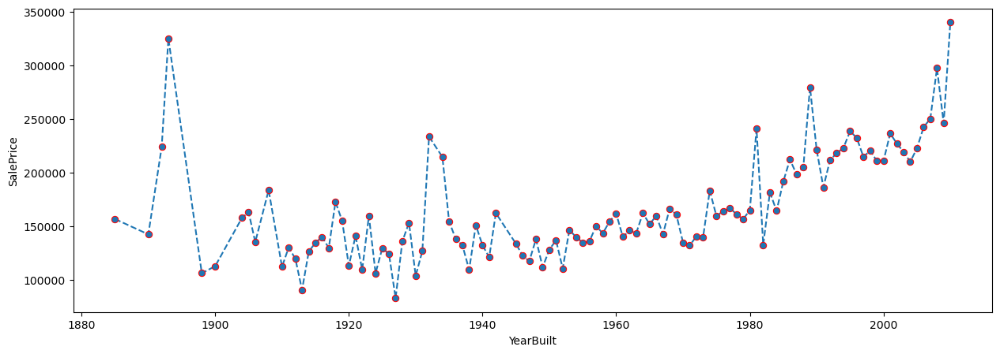

In [30]:
plt.figure(figsize = (15,5))
sns.lineplot(x = 'YearBuilt',y = 'SalePrice',data = df,errorbar=None,marker='o',markeredgecolor='r',linestyle='--')
plt.show()

In [31]:
import plotly.express as px

fig = px.bar(data_frame = df,x = 'FireplaceQu',y = 'SalePrice' , color = 'Street',barmode='group',
             color_discrete_sequence=['blue', 'maroon'])
fig.show()

In [32]:
import plotly.express as px

fig = px.bar(x = 'HouseStyle' , y = 'LotArea',data_frame = df,color='HouseStyle'
,color_discrete_sequence=['green', 'red', 'Dark Blue', 'Purple', 'Dark Orange', 'yellow','Teal','Aqua']
,title="Area Comparison of House Style")
fig.show()

In [33]:
fig = px.pie(data_frame = df , names = 'SaleCondition' , values = 'YrSold',title = 'Proportion of Total Year Sold by Sale Condition',hole =0
             ,color_discrete_sequence = ['#FFA07A', '#87CEFA', '#90EE90', '#FFD700', '#9370DB', '#FFB6C1'])
fig.show()

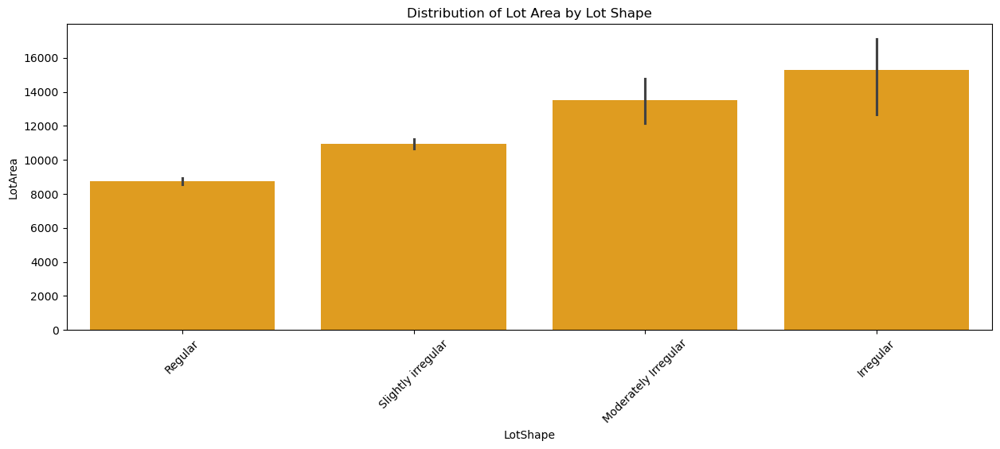

In [34]:
plt.figure(figsize = (15,5))
sns.barplot(x = 'LotShape',y = 'LotArea',data = df,color = 'orange')
plt.xticks(rotation = 45)
plt.title("Distribution of Lot Area by Lot Shape")
plt.show()

# Multivariate

<Axes: >

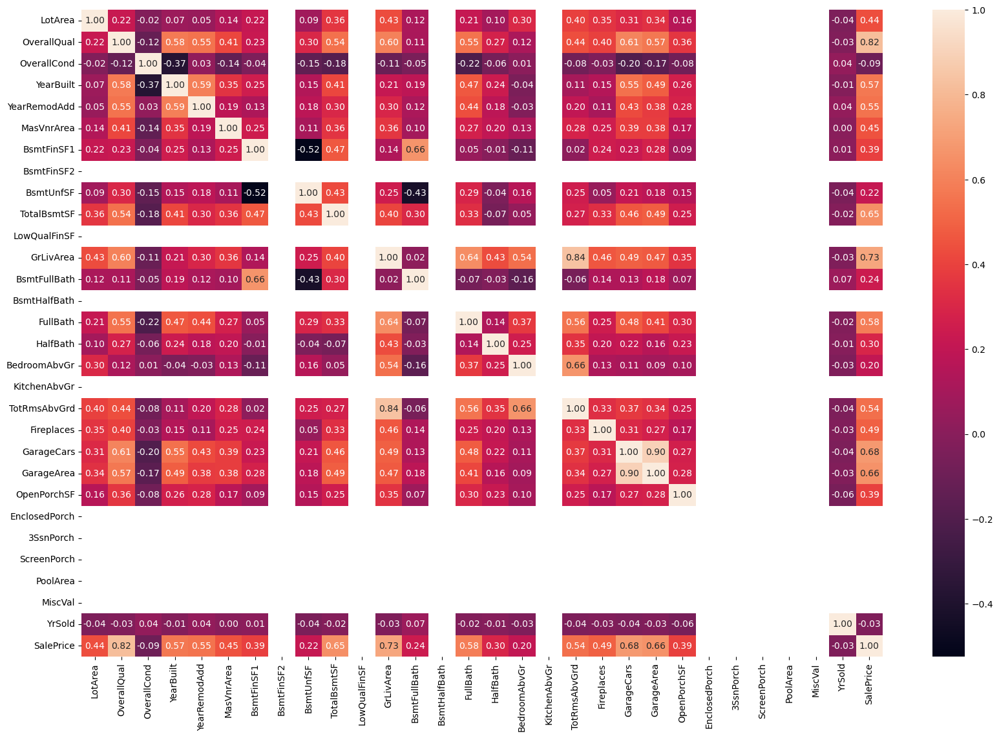

In [35]:
correlation = df[numerical_col].corr()
plt.figure(figsize = (20,13))
sns.heatmap(correlation,fmt=".2f",annot = True)

## Correlation Analysis: 

The notebook calculates the correlation matrix and visualizes it with a heatmap. This helps identify features that are strongly correlated with the target variable (SalePrice) and with each other.

In [36]:
# Filling the missings values

for col in numerical_col:
  df[col] = df[col].fillna(df[col].median())

for col in categorical_col:
  df[col] = df[col].fillna(df[col].mode()[0])

In [37]:
df.isnull().sum()

Unnamed: 0       0
MSSubClass       0
MSZoning         0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrType       0
MasVnrArea       0
ExterQual        0
Foundation       0
BsmtQual         0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
CentralAir       0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Fireplaces       0
FireplaceQu      0
GarageCars       0
GarageArea       0
PavedDrive       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
dtype: int64

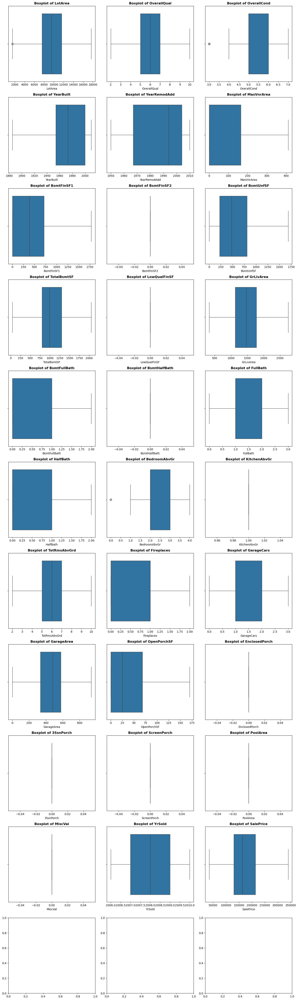

In [38]:
fig , axes = plt.subplots(nrows = 11,ncols = 3 , figsize = (15,50))
axes = axes.flatten()

for index , col in enumerate(numerical_col):
  sns.boxplot(x = df[col],ax = axes[index]).set_title(f"Boxplot of {col}",fontweight = 'bold')
  plt.tight_layout()

plt.show()

In [39]:
# outliers

outliers_name = []

for col in numerical_col:
  Q1 = df[col].quantile(0.25)
  Q3 = df[col].quantile(0.75)
  IQR = Q3 - Q1
  Lower_bond = Q1 - 1.5 * IQR
  Upper_bond = Q3 + 1.5 * IQR
  df = df[(df[col] >= Lower_bond) & (df[col] <= Upper_bond)]

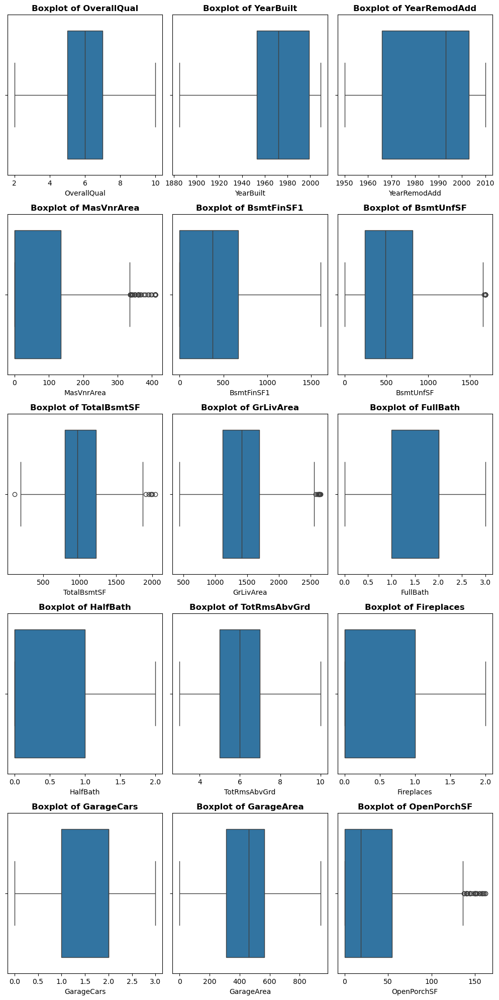

In [63]:
fig , axes = plt.subplots(nrows = 5,ncols = 3 , figsize = (10,20))
axes = axes.flatten()

for index , col in enumerate(numerical_col):
  sns.boxplot(x = df[col],ax = axes[index]).set_title(f"Boxplot of {col}",fontweight = 'bold')
  plt.tight_layout()

plt.show()

# Skewness & Transformation

In [41]:
# Skewness

skewness = df[numerical_col].skew()

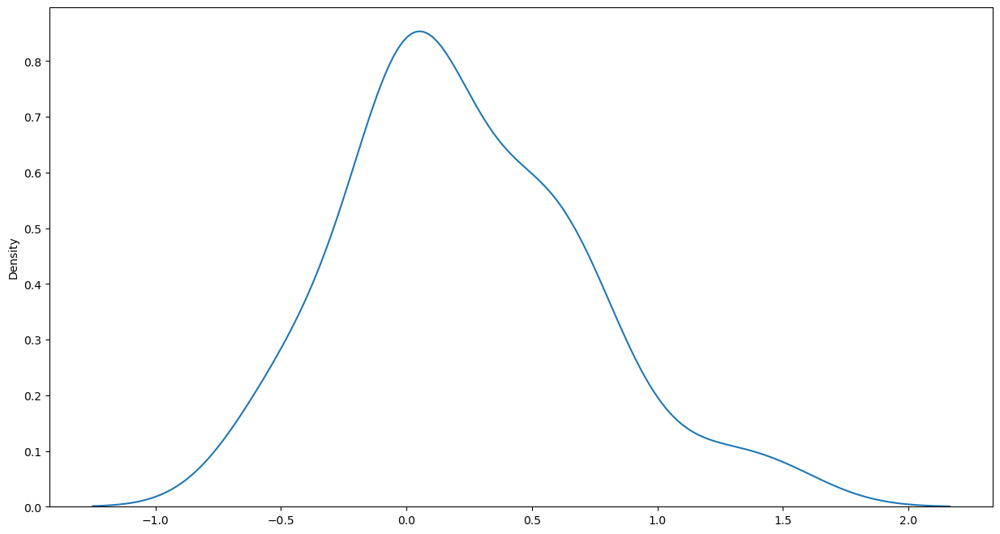

In [42]:
plt.figure(figsize=(15,8))
sns.kdeplot(skewness)
plt.show()

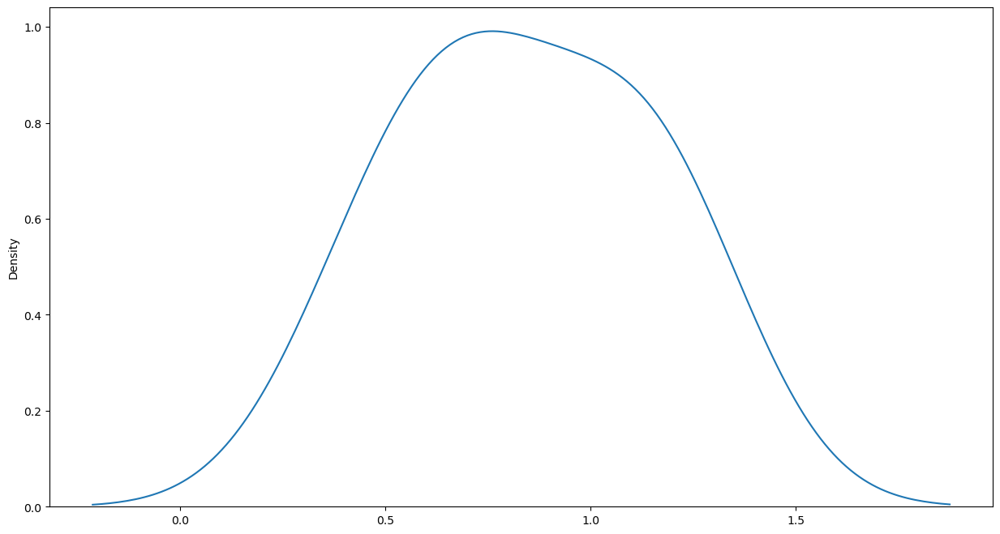

In [43]:
# squaring
skewness_sqrt = df[['SalePrice','OpenPorchSF','GarageArea','GrLivArea','MasVnrArea','LotArea']].skew() ** 0.5
plt.figure(figsize=(15,8))
sns.kdeplot(skewness_sqrt)
plt.show()

In [44]:
skewness_sqrt

SalePrice      0.794141
OpenPorchSF    1.090341
GarageArea          NaN
GrLivArea      0.669104
MasVnrArea     1.206893
LotArea        0.454756
dtype: float64

In [45]:
fig = ff.create_distplot([skewness], ['Outliers'], show_hist=False)
fig.show()

## Feature Selection and Model Building

### Label Encoding:

LabelEncoder is used to convert categorical labels (text or non-numeric data) into numerical values,so that machine learning models can understand and process the data

In [46]:
# Label Encoding

from sklearn.preprocessing import LabelEncoder

encode = LabelEncoder()

for col in categorical_col:
  df[col] = encode.fit_transform(df[col])

## Selecting the Features & Target:

Features are input variables, and the target is the output we're trying to predict or classify in machine learning.

### Top Features:

By Selecting the top features with SelectKBest to identify the most important variables and improving model accuracy.

In [47]:
# Selecting the Features & Target --

x = df.drop(['Unnamed: 0','SalePrice'],axis =1) # Feature
y = df['SalePrice'] #Target


# Top features
from sklearn.feature_selection import SelectKBest,f_classif

k = 25

selector = SelectKBest(score_func = f_classif, k=k)
selector.fit(x,y)


# Displaying the top features:
Selected_features = x.columns[selector.get_support()]
print(Selected_features)


# Selecting Relevant Features and Filtering Numerical Columns
x_selected = x[Selected_features]

# Filters the numerical_col list to only include columns that are present in Selected_features.
numerical_col = [col for col in numerical_col if col in Selected_features]


Index(['MSZoning', 'Street', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'MasVnrType', 'MasVnrArea', 'ExterQual', 'Foundation', 'BsmtQual',
       'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', 'CentralAir', 'GrLivArea',
       'FullBath', 'HalfBath', 'KitchenQual', 'TotRmsAbvGrd', 'Fireplaces',
       'FireplaceQu', 'GarageCars', 'GarageArea', 'OpenPorchSF', 'SaleType'],
      dtype='object')


C:\Users\Sukriti Singh\anaconda3\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning:

invalid value encountered in divide



## Train Test Split:

#### x_train and y_train: These are the features (x) and target (y) used to train the model.

#### x_test and y_test: These are the features and target used to test how well the model performs on new, unseen data.

By setting test_size = 0.2, we use 20% of the data for testing and 80% for training. The random_state = 55 ensures the split is the same every time

In [48]:
# Train Test Split

from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(x_selected,y,test_size = 0.2 , random_state = 55)

In [49]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Train
x_train[numerical_col] = scaler.fit_transform(x_train[numerical_col])

# Test
x_test[numerical_col] = scaler.transform(x_test[numerical_col])

## Model Building

In [50]:
!pip install xgboost
!pip install scikit-learn
!pip install catboost

## Overview of Regression Models and Performance Metrics

### LinearRegression:

A basic model for predicting a target variable based on a straight-line relationship with the input variables (features).
Best for simple datasets with linear relationships.
    
### DecisionTreeRegressor:


A tree-based model that splits data into branches based on feature values.
Works well for capturing non-linear relationships. ### Pruning the Decision Tree:
To improve the performance of our decision tree model and avoid overfitting, we can implement pruning by setting the max_depth parameter. Pruning helps in reducing the complexity of the model by limiting the number of levels in the tree, which in turn simplifies the model and makes it more generalizable.

### KNeighborsRegressor:

Predicts a value based on the average of the nearest data points (neighbors).
Works well for smaller datasets with clear patterns.
The prediction is typically the average of the target values of the k nearest neighbors. This means you calculate the mean of the values of the k nearest neighbors to make the prediction.
RandomForestRegressor:

#### An ensemble model made of multiple decision trees.
    
Combines the predictions of many trees to improve accuracy and reduce overfitting.
AdaBoostRegressor:

A boosting model that builds a series of weak models (like small decision trees) and combines them for better performance.
Focuses more on correcting mistakes made by earlier models.
                                                                                                  
GradientBoostingRegressor:

Gradient Boosting builds models sequentially, like AdaBoost, but instead of adjusting weights, it fits the new model to the residual errors made by the previous models. ## Key Concept:

Train models to reduce the residual errors of the combined model.

### Advantages:

More flexible and can be adapted for many loss functions.
Typically outperforms AdaBoost on most tasks.
    
### XGBRegressor (XGBoost):

An advanced gradient boosting model optimized for speed and performance.
Handles large datasets and complex relationships well.
SVR (Support Vector Regressor):

A model that tries to fit the best line (or curve) within a margin of tolerance.
Good for datasets with fewer features or specific patterns.

#### CatBoostRegressor:

Provides high accuracy with less parameter tuning and works well with real-world data.

#### Metrics:

R2 Score: Measures how well the model explains the variation in data. Higher is better.
Mean Absolute Error (MAE): Average absolute difference between predicted and actual values. Lower is better.
Mean Squared Error (MSE): Penalizes larger errors more than smaller ones. Lower is better.
Root Mean Squared Error (RMSE): Square root of MSE, gives an idea of error magnitude. Lower is better.

In [51]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error


regressor = {
    'LinearRegression' : LinearRegression(),
    'DecisionTreeRegressor' : DecisionTreeRegressor(),
    'RandomForestRegressor' : RandomForestRegressor(),
    'KNeighborsRegressor' : KNeighborsRegressor(),
    'SVM' : SVR(),
    'AdaBoostRegressor' : AdaBoostRegressor(),
    'GradientBoostRegressor' : GradientBoostingRegressor(),
    'XGBRegressor' : XGBRegressor(),
    'CatBoostRegressor' : CatBoostRegressor(verbose=0)
}


result = []

for name,reg in regressor.items():
  reg.fit(x_train,y_train)
  y_pred = reg.predict(x_test)

  # R 2 Score --
  r2 = r2_score(y_test,y_pred)

  # Mean absolute error --
  MAE = mean_absolute_error(y_test,y_pred)

  #Mean Squared Error --
  MSE = mean_squared_error(y_test,y_pred)

  # Root Mean Squared Error --
 

  # storing in results
  result.append((name,r2,MAE,MSE))


result_df = pd.DataFrame(result,columns = ['Models','R 2 Score','Mean absolute error','Mean Squared Error'])
result_df

,Models,R 2 Score,Mean absolute error,Mean Squared Error
0,LinearRegression,0.840482,15441.193116,4.188036e+08
1,DecisionTreeRegressor,0.700635,20373.706612,7.859630e+08
2,RandomForestRegressor,0.848722,14636.333733,3.971696e+08
3,KNeighborsRegressor,0.797218,16922.633884,5.323914e+08
4,SVM,-0.013828,39531.304926,2.661737e+09
5,AdaBoostRegressor,0.800700,17511.153866,5.232476e+08
6,GradientBoostRegressor,0.856494,14767.244667,3.767652e+08
7,XGBRegressor,0.820013,15724.382651,4.725437e+08
8,CatBoostRegressor,0.880228,13048.497177,3.144540e+08


In [52]:
best_model = result_df.sort_values(by = 'R 2 Score',ascending = False).iloc[0]

print(f"The best model is {best_model['Models']} with the R_2 score of {best_model['R 2 Score']:.2f} and Mean absolute error of {best_model['Mean absolute error']:.2f}")

The best model is CatBoostRegressor with the R_2 score of 0.88 and Mean absolute error of 13048.50


CatBoostRegressor is the best overall performances with the highest r2 score of (0.90) and **Mean absolute error (10885.33)

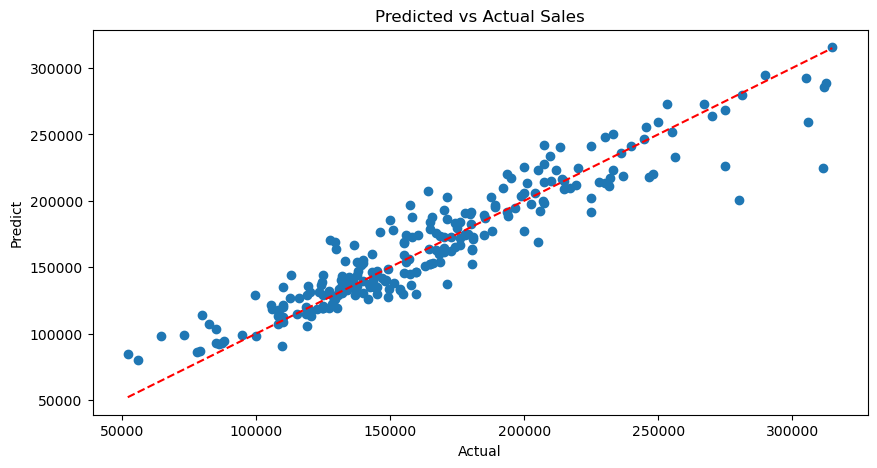

In [53]:
# Predicted vs Actual Sales"

plt.figure(figsize = (10,5))
plt.scatter(x = y_test, y = y_pred)
plt.plot([y_test.min(),y_test.max()] , [y_test.min(),y_test.max()],color = 'red',linestyle = '--')
plt.xlabel("Actual")
plt.ylabel("Predict")
plt.title("Predicted vs Actual Sales")
plt.show()

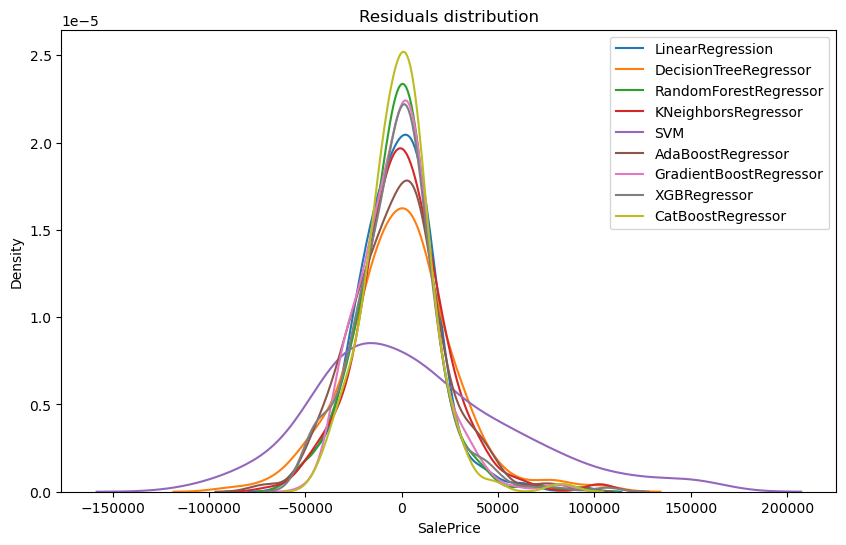

In [54]:
# Residuals distribution

plt.figure(figsize = (10,6))
for name,reg in regressor.items():
  reg.fit(x_train,y_train)
  y_pred = reg.predict(x_test)
  Residuals = y_test - y_pred

  sns.kdeplot(Residuals,label = name)

plt.legend()
plt.title("Residuals distribution")
plt.show()

In [55]:
# Rounding the R 2 Score to 2 decimal places for the text labels

result_df['R 2 Score (formatted)'] = result_df['R 2 Score'].round(3)

fig = px.bar(x=result_df['Models'] , y = result_df['R 2 Score'],color = result_df['R 2 Score'], title="Model Performance (R2 Score)"
             ,template='plotly_dark',color_continuous_scale='Viridis',text=result_df['R 2 Score (formatted)'])


fig.update_layout(
    xaxis_title = "Models",
    yaxis_title = "R2 Score"
)

fig.show()

## Final Recommendation Based on Performance:

### Best Models to Use:

LinearRegression and CatBoostRegressor are the best model to get result with high accuracy.

#### Models That Can Be Improved:

#### DecisionTreeRegressor: 

After tuning, its performance improved slightly (R² from 0.6881 to 0.7520). While it is not the best model, it shows potential for further improvement with additional tuning.

#### AdaBoostRegressor: 
It has moderate performance (R² = 0.8198 after tuning), but adjusting it further probably won’t make a big difference. Keeping it as a backup option.

In [56]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from sklearn.metrics import r2_score,mean_absolute_error


x_train,x_test,y_train,y_test = train_test_split(x_selected,y,test_size = 0.2 , random_state = 55)

final_reg = {
    'LinearRegression': LinearRegression(fit_intercept = True),
    'CatBoostRegressor': CatBoostRegressor(depth = 10, iterations = 150, l2_leaf_reg = 5, learning_rate =0.1,verbose = 0)
}

final_result = []

for name,regs in final_reg.items():
  regs.fit(x_train,y_train)
  y_pred = regs.predict(x_test)
  r2_scores = r2_score(y_test,y_pred)
  mae = mean_absolute_error(y_test,y_pred)
  final_result.append((name,r2_scores,mae))

final_result_df = pd.DataFrame(final_result,columns = ['Models','R 2 Score','Mean absolute error'])
final_result_df


,Models,R 2 Score,Mean absolute error
0,LinearRegression,0.840482,15441.193116
1,CatBoostRegressor,0.851100,14180.659940


In [66]:
df.to_csv('df.csv', index=False) 

In [67]:
df = pd.read_csv('df.csv')

                                                        # Thank You